<a href="https://colab.research.google.com/github/kellydang70/BayAreaHousing/blob/main/cs133_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**CS 133 Term Project**



**Project Deliverables**

1. Each project team will choose one of the following data sets for their project. Create a Google Colab notebook to perform the data analysis and visualization for this project. Create and answer at least 5 unique questions using different types of plots to help you understand the data. One of the plots must be a map visualization. Besides the map, one of the plots must be an interactive plot. You can create additional categorical columns or reshape your data to help you understand the data.

2. Each data set has a prediction goal. Create a test set and a training set using the original data set.

3. Follow the steps that we use in Lecture and Hands-ons 15 and 16 to prepare the data and pipeline for training a few ML classification or regression models that can perform the prediction as indicated in the data set description. Use any strategy that you see fit. Use N-fold cross-validation to evaluate the performance of each model.

4. Use the appropriate metrics to evaluate the models' performance. Select the best one for fine-tuning.

5. Test your best and fine-tuned ML model using the test set.

6. Create a Google slideshow presentation (5-10 min long) in which your group with explain the following:

   - How the data visualization help you with choosing certain strategies in developing the ML training pipeline
   - What strategy is used to create test/train data
   - What ML models are chosen, and why are they suitable for this analysis
the performance of all trained models (including the performance metrics)
   - Show the prediction performance of the best ML model using the test set.
   - To wrap up, discuss the challenges you have encountered and/or any other thoughts you have about this project.

7. Submit the urls for the Colab notebook and the Google slides in Canvas.



---

#**SF Bay Area House Prices**

<img src="https://www.worldpropertyjournal.com/news-assets/San-Francisco-homes-california-keyimage.jpg" width=600>  
<font size=2 color=gray>Image Credit: World Property Journal</font>  


Bay Area real estate prices have been rapidly appreciating since 2012. Over the last decade, median property values have more than doubled, and some areas of the Bay Area have more than tripled!

The rapidly escalating prices are great for those that have already bought into the market. For potential homebuyers, these escalating prices result in getting less home for your dollar (and/or having to increase your budget), and gives pause as to not wanting to buy at the peak of the market.

Here is a data set of over 7,000 active listings from June 2019 containing factors influencing home prices across the region, including number of bedrooms and bathrooms, home size, lot size, school quality, and commute times.

Here are the descriptions of the data:

- `Address` - the adddress of the house
- `City` - the city the house is at
- `State` - California, this data set is from the Bay Area
- `Zip` - postal zip code
- `Price` - listing price of the house
- `Beds` - number of bedrooms
- `Baths` - number of bathrooms
- `Home size` - the square footage of the house
- `Lot size` - the square footage of the lot
- `Latitude` - latitude coordinate
- `Longitude` - longitude coodinate
- `SF time` - the commute time by car at 8 AM to San Francisco
- `PA time` - the commute time by car at 8 AM to commute to Palo Alto
- `School score` - the quality of the schools in the neighborhood
- `Commute time` - the commute time by car at 8 AM to the general Bay Area.

Data Source Credit: Michael Boles

###**Prediction**

You are tasked to build a ML model to predict the price of the homes in the SF Bay Area.

###**Questions: (5)**

## 1. Data Exploration

In [ ]:
import pandas as pd

data='https://raw.githubusercontent.com/csbfx/cs133/main/sf_bayarea_house_prices.csv'
df = pd.read_csv(data, na_values=['?'])

print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7145 entries, 0 to 7144
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Address       7137 non-null   object 
 1   City          7145 non-null   object 
 2   State         7145 non-null   object 
 3   Zip           7145 non-null   int64  
 4   Price         7145 non-null   int64  
 5   Beds          7145 non-null   int64  
 6   Baths         7145 non-null   float64
 7   Home size     7063 non-null   float64
 8   Lot size      6880 non-null   float64
 9   Latitude      7145 non-null   float64
 10  Longitude     7145 non-null   float64
 11  SF time       7145 non-null   int64  
 12  PA time       7145 non-null   int64  
 13  School score  7085 non-null   float64
 14  Commute time  7145 non-null   int64  
dtypes: float64(6), int64(6), object(3)
memory usage: 837.4+ KB
None


In [ ]:
df.head(20)

,Address,City,State,Zip,Price,Beds,Baths,Home size,Lot size,Latitude,Longitude,SF time,PA time,School score,Commute time
0,2412 Palmer Ave,Belmont,CA,94002,1459000,3,2.0,1360.0,5001.0,37.516781,-122.304623,63,33,77.9,33
1,1909 Hillman Ave,Belmont,CA,94002,1595000,4,2.0,2220.0,3999.0,37.521972,-122.294079,63,33,77.9,33
2,641 Waltermire St,Belmont,CA,94002,899999,2,1.0,840.0,4234.0,37.520233,-122.273144,63,33,77.9,33
3,2706 Sequoia Way,Belmont,CA,94002,1588000,3,2.0,1860.0,5210.0,37.520192,-122.309437,63,33,77.9,33
4,1568 Winding Way,Belmont,CA,94002,1999000,4,3.5,2900.0,16117.2,37.524280,-122.291241,63,33,77.9,33
5,1440 5th Ave,Belmont,CA,94002,1249950,2,1.0,1170.0,5001.0,37.516227,-122.272763,63,33,77.9,33
6,1527 Ridge Rd,Belmont,CA,94002,1485000,3,2.0,1220.0,5502.0,37.522964,-122.290578,63,33,77.9,33
7,1249 North Rd,Belmont,CA,94002,1995000,4,3.5,2720.0,9601.0,37.523886,-122.286862,63,33,77.9,33
8,685 South Rd,Belmont,CA,94002,1988000,3,3.0,2610.0,11325.6,37.520637,-122.281695,63,33,77.9,33
9,2501 Lincoln Ave,Belmont,CA,94002,1598000,3,2.0,1508.0,6100.0,37.518087,-122.306904,63,33,77.9,33


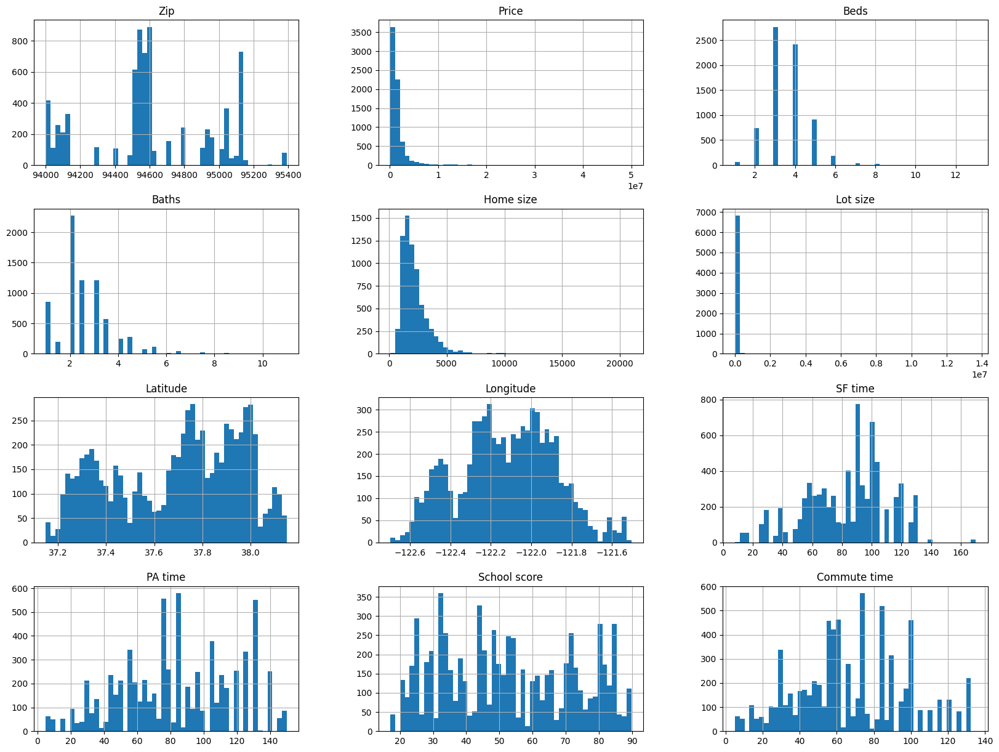

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
df.hist(bins=50, figsize=(20,15))
plt.show()

# price is skewed, so use stratified sampling

In [ ]:
df.isnull()

,Address,City,State,Zip,Price,Beds,Baths,Home size,Lot size,Latitude,Longitude,SF time,PA time,School score,Commute time
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7140,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False
7141,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False
7142,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False
7143,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False


In [ ]:
df.describe()

,Zip,Price,Beds,Baths,Home size,Lot size,Latitude,Longitude,SF time,PA time,School score,Commute time
count,7145.000000,7.145000e+03,7145.000000,7145.000000,7063.000000,6.880000e+03,7145.000000,7145.000000,7145.000000,7145.000000,7085.000000,7145.000000
mean,94610.732120,1.676225e+06,3.594822,2.572498,2244.186040,2.807283e+04,37.692989,-122.124319,83.335899,83.850385,52.669273,67.370749
std,343.763512,2.407593e+06,1.030743,1.127692,1369.340525,3.215086e+05,0.262637,0.238086,27.048451,34.195327,20.007771,29.160700
min,94002.000000,1.290000e+05,1.000000,1.000000,107.000000,4.360000e+02,37.150065,-122.698597,8.000000,5.000000,17.100000,5.000000
25%,94509.000000,7.299500e+05,3.000000,2.000000,1408.000000,4.850750e+03,37.450607,-122.281695,65.000000,60.000000,33.800000,47.000000
50%,94572.000000,1.099988e+06,4.000000,2.500000,1904.000000,6.477000e+03,37.741127,-122.117378,90.000000,85.000000,50.900000,63.000000
75%,94920.000000,1.699000e+06,4.000000,3.000000,2646.500000,1.001880e+04,37.915970,-121.951238,100.000000,110.000000,71.000000,90.000000
max,95391.000000,4.999000e+07,13.000000,11.000000,20982.000000,1.364561e+07,38.149218,-121.503746,170.000000,150.000000,89.800000,135.000000


Text(0.5, 1.0, 'high correlation in baths, beds, and home size')

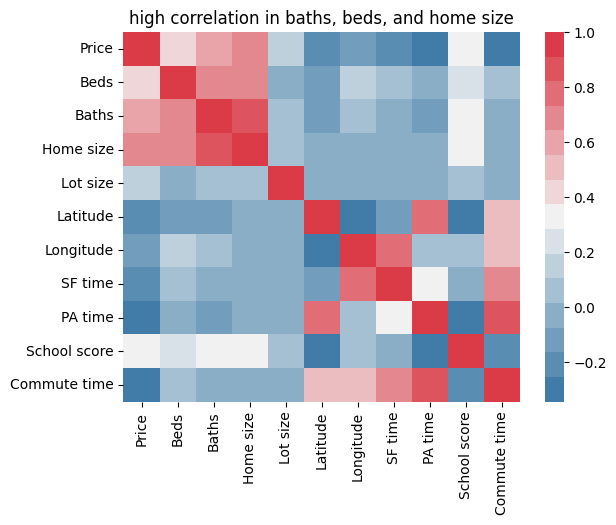

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
df_tester = df.copy()
corr_matrix =  df_tester.drop(['Address', 'City', 'State', 'Zip'], axis=1).corr()

sns.heatmap(corr_matrix, cmap=sns.diverging_palette(240, 10, n=15))
plt.title("high correlation in baths, beds, and home size")

Text(0.5, 1.05, 'Pairwise relationships in Bay Area Housing Data')

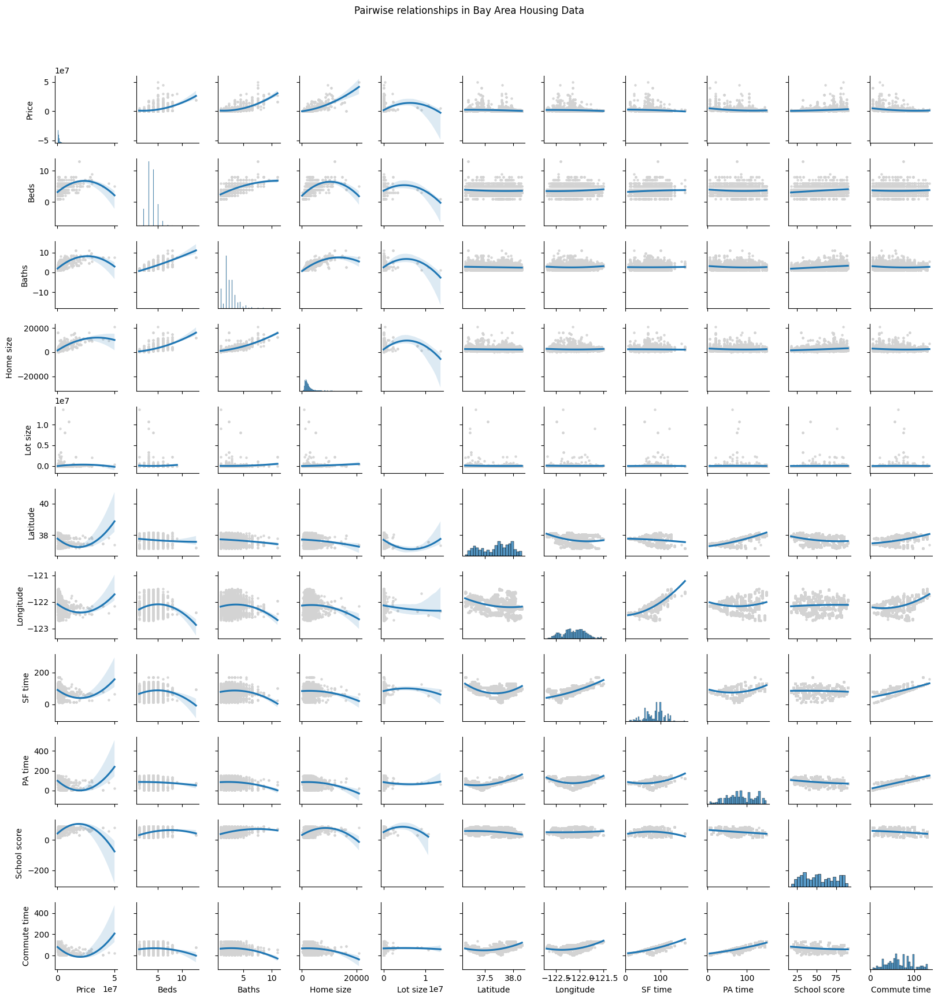

In [ ]:
g=sns.pairplot(df_tester.drop(['Address', 'City', 'State', 'Zip'], axis=1),
             kind="reg",
             plot_kws={"scatter_kws":{"color":"lightgrey", "s":5}, "order":2},
             height=1.5
             )
g.fig.suptitle("Pairwise relationships in Bay Area Housing Data", y=1.05)

Text(0.5, 1.0, 'Cluster of expensive houses around lower longitude and latitude values')

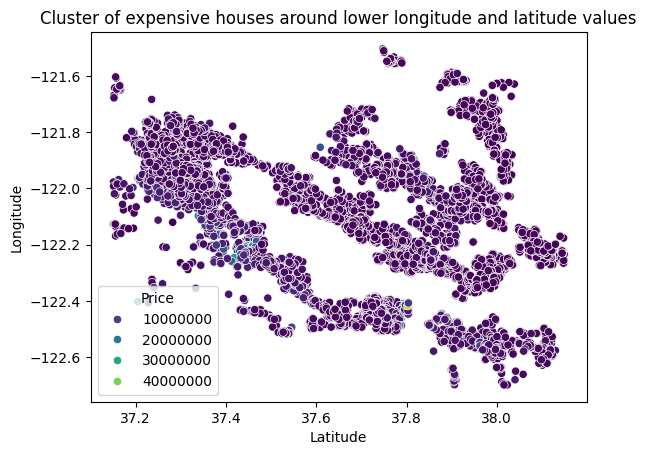

In [ ]:
g=sns.scatterplot(data=df_tester, x="Latitude", y="Longitude", hue="Price", palette="viridis")
plt.title("Cluster of expensive houses around lower longitude and latitude values")

In [ ]:
import folium
from geopy.exc import GeocoderTimedOut
from geopy.geocoders import Nominatim

# find lat & long
longitude = []
latitude = []
def findGeocode(city):
    try:
        geolocator = Nominatim(user_agent="CS133")
        return geolocator.geocode(city)
    except GeocoderTimedOut:
        return None

location_sf = findGeocode("San Francisco")
ca_lat = location_sf.latitude
ca_long = location_sf.longitude
bay_map = folium.Map(location=[ca_lat, ca_long], zoom_start = 10)

def color_scale(p):
  if p < 500000:
    return 'yellow'
  elif p < 1000000:
    return 'orange'
  elif p < 1500000:
    return 'red'
  elif p < 2000000:
    return 'purple'
  else:
    return 'black'

for i in range(0, len(df)):
  lat = float(df.iloc[i]['Latitude'])
  long_ = float(df.iloc[i]['Longitude'])
  pp = df.iloc[i]['Price']
  folium.Circle(
      location=[lat, long_],
      radius=50,
      color=color_scale(pp),
      fill=True,
      popup=pp
  ).add_to(bay_map)
bay_map

In [ ]:
import plotly.express as px
df['City'].value_counts()
new_df = df['City'].value_counts().reset_index()
new_df.columns = ["City", "Total"]
# gets only majority
new_df_df = new_df[new_df["Total"] > 50]

fig = px.pie(new_df_df, values="Total", names="City", title="Total number of cities in dataset")
fig.show()


## 2. Prepare Training & Testing Data Sets

Axes(0.125,0.11;0.775x0.77)


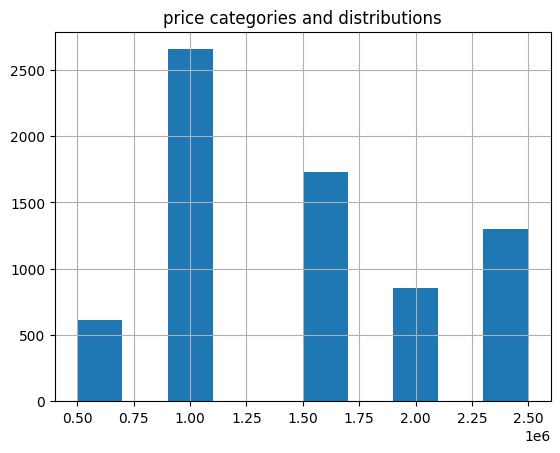

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit
import numpy as np

df["price_cat"] = pd.cut(df["Price"],
                              bins=[0, 500000, 1000000, 1500000, 2000000, np.inf],
                              labels=[500000, 1000000, 1500000, 2000000, 2500000])

print(df["price_cat"].hist())
plt.title("price categories and distributions")

split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(df, df["price_cat"]):
    strat_train_set = df.loc[train_index]
    strat_test_set = df.loc[test_index]

for set_ in (strat_train_set, strat_test_set):
    set_.drop("price_cat", axis=1, inplace=True)

# training set --> separating predictors & labels
df = strat_train_set.drop("Price", axis=1) # drop labels for training set
df_labels = strat_train_set["Price"].copy()

# testing set
X_test = strat_test_set.drop("Price", axis=1)
y_test = strat_test_set["Price"].copy()

In [ ]:
strat_train_set

,Address,City,State,Zip,Price,Beds,Baths,Home size,Lot size,Latitude,Longitude,SF time,PA time,School score,Commute time
6335,3567 Sunnylake Ct,San Jose,CA,95117,1580000,4,2.5,2254.0,6200.0,37.302616,-121.962473,115,45,39.2,45
3204,4450 Fall Ln,Oakley,CA,94561,409900,3,2.0,1102.0,4080.0,37.989065,-121.697598,130,150,34.8,130
3369,1275 Gloria Dr,Pittsburg,CA,94565,460000,3,2.0,1497.0,7150.0,37.993993,-121.875014,115,130,24.9,115
247,1150 Grant Rd,Los Altos,CA,94024,1998000,3,2.0,1329.0,11325.6,37.362679,-122.078107,70,29,88.4,29
6273,NaN,San Jose,CA,95111,815000,3,2.0,1927.0,5942.0,37.294899,-121.839035,120,75,40.4,75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
842,921 Lakebird Dr,Sunnyvale,CA,94089,1140000,3,2.0,1258.0,5942.0,37.399508,-121.998844,88,29,51.2,29
2517,24555 Margaret Dr,Hayward,CA,94542,673000,3,2.0,1604.0,4584.0,37.663601,-122.074605,95,75,38.7,75
3585,271 W Broadmoor Blvd,San Leandro,CA,94577,625000,3,2.0,1507.0,3720.0,37.733426,-122.165876,75,75,33.5,75
3193,487 Vinewood Dr,Oakley,CA,94561,580000,4,3.0,1940.0,10018.8,37.988959,-121.703307,130,150,34.8,130


In [ ]:
df.columns

Index(['Address', 'City', 'State', 'Zip', 'Beds', 'Baths', 'Home size',
       'Lot size', 'Latitude', 'Longitude', 'SF time', 'PA time',
       'School score', 'Commute time'],
      dtype='object')

## 3. Pre-processing Data

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin

# dropping: state, address,
# zip code (int) --> category ?

# null: home size, lot size, school score

# dropped commute time bc commute time just takes the lowest val b/w sf time and pa time
numerical_cat = ['Beds', 'Baths', 'Home size', 'Lot size', 'SF time', 'PA time', 'School score', 'Latitude', 'Longitude']
categorical_cat = ['City', 'Zip']

# handling na values
imputer = SimpleImputer(strategy="median")
df_num = df[numerical_cat]
imputer.fit(df_num)
X = imputer.transform(df_num)

# handling categorical attributes
df_cat = df[categorical_cat]
cat_encoder = OneHotEncoder()
df_cat_1hot = cat_encoder.fit_transform(df_cat)

# set indices for custom transformer
beds_idx, baths_idx, home_idx, lot_idx = [
      list(df.columns).index(col)
      for col in ('Beds', 'Baths', 'Home size', 'Lot size')
  ]
# custom transformer class
class CombinedAttributesAdder(BaseEstimator, TransformerMixin):
  def __init__(self, add_bed_per_home = True):
    self.add_bed_per_home = add_bed_per_home

  def fit(self, X, y=None):
    return self

  def transform(self, X, y=None):
    baths_per_home = X[:, baths_idx] / X[:, home_idx]
    beds_per_lot = X[:, beds_idx] / X[:, lot_idx]

    if self.add_bed_per_home:
      beds_per_home = X[:, beds_idx] / X[:, home_idx]
      return np.c_[X, baths_per_home, beds_per_lot, beds_per_home]
    else:
      return np.c_[X, baths_per_home, beds_per_lot]

attr_adder = CombinedAttributesAdder(add_bed_per_home=False)
df_extra_attribs = attr_adder.transform(df.values)

num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('attribs_adder', CombinedAttributesAdder()),
    ('std_scaler', StandardScaler())
])

df_num_tr = num_pipeline.fit_transform(df_num)

full_pipeline = ColumnTransformer([
    ("num", num_pipeline, numerical_cat),
    ("cat", OneHotEncoder(handle_unknown='ignore'), categorical_cat)
])

df_prepared = full_pipeline.fit_transform(df)

## 4. Select ML Models, perform 10-fold Cross Validation

linear regression model:

In [ ]:
# linear regression

from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(df_prepared, df_labels)

LinearRegression()

In [ ]:
random_data = df.iloc[:5]
random_labels = df_labels.iloc[:5]
df_data_prepared = full_pipeline.transform(random_data)

print("predictions:", lin_reg.predict(df_data_prepared))

predictions: [1755445.13166613 -414008.48780684  264485.70066796 2549514.93126919
 1281473.06532852]


In [ ]:
random_data

,Address,City,State,Zip,Beds,Baths,Home size,Lot size,Latitude,Longitude,SF time,PA time,School score,Commute time
6335,3567 Sunnylake Ct,San Jose,CA,95117,4,2.5,2254.0,6200.0,37.302616,-121.962473,115,45,39.2,45
3204,4450 Fall Ln,Oakley,CA,94561,3,2.0,1102.0,4080.0,37.989065,-121.697598,130,150,34.8,130
3369,1275 Gloria Dr,Pittsburg,CA,94565,3,2.0,1497.0,7150.0,37.993993,-121.875014,115,130,24.9,115
247,1150 Grant Rd,Los Altos,CA,94024,3,2.0,1329.0,11325.6,37.362679,-122.078107,70,29,88.4,29
6273,NaN,San Jose,CA,95111,3,2.0,1927.0,5942.0,37.294899,-121.839035,120,75,40.4,75


In [ ]:
print("Labels:", list(random_labels))

Labels: [1580000, 409900, 460000, 1998000, 815000]


In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error

df_predictions = lin_reg.predict(df_prepared)

lin_mse = mean_squared_error(df_labels, df_predictions)
lin_rmse = np.sqrt(lin_mse)
print("lin_rmse:", lin_rmse)

# mean absolute error
lin_mae = mean_absolute_error(df_labels, df_predictions)
print("lin_mae:", lin_mae)

# model typical prediction error is $1183314.8
# underfiting


# 10 fold validation
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

lin_scores = cross_val_score(lin_reg, df_prepared, df_labels,
                        scoring="neg_mean_squared_error", cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)

display_scores(lin_rmse_scores)

lin_rmse: 1183314.6629400563
lin_mae: 519038.0420968002
Scores: [1068629.36918674 1156587.30055066  803790.43069028  837511.7021614
 1389725.91977998  963160.24382653 1733261.6261078  1157158.55454911
 1603441.72012842 1469292.12321705]
Mean: 1218255.8990197983
Standard deviation: 302946.48549555946


random forest regression model

In [ ]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = RandomForestRegressor(n_estimators=10, random_state=42)
forest_reg.fit(df_prepared, df_labels)
forest_reg_predictions = forest_reg.predict(df_prepared)

forest_reg_mse = mean_squared_error(df_labels, forest_reg_predictions)
forest_reg_rmse = np.sqrt(forest_reg_mse)
print("forest_reg_rmse:", forest_reg_rmse)

# mean absolute error
forest_reg_mae = mean_absolute_error(df_labels, forest_reg_predictions)
print("forest_reg_mae:", forest_reg_mae)

# model typical prediction error is $1183314.8
#

# 10 fold validation
forest_scores = cross_val_score(forest_reg, df_prepared, df_labels,
                        scoring="neg_mean_squared_error", cv=10)
forest_rmse_scores = np.sqrt(-forest_scores)

display_scores(forest_rmse_scores)

forest_reg_rmse: 372065.7716703335
forest_reg_mae: 105714.00218684395
Scores: [ 948390.19314731  730620.12532207  596086.31684889  658552.33962276
 1125553.76105848  603005.68633245 1342904.66300999 1144704.83833007
 1626378.22589697  843746.36802489]
Mean: 961994.2517593892
Standard deviation: 326982.21630526736


In [ ]:
# decision tree regressor
from sklearn.tree import DecisionTreeRegressor

decision_tree_reg = DecisionTreeRegressor(random_state=42)
decision_tree_reg.fit(df_prepared, df_labels)
decision_tree_reg_predictions = decision_tree_reg.predict(df_prepared)

decision_tree_reg_mse = mean_squared_error(df_labels, decision_tree_reg_predictions)
decision_tree_reg_rmse = np.sqrt(decision_tree_reg_mse)
print("decision_tree_reg_rmse:", decision_tree_reg_rmse)

# mean absolute error
decision_tree_reg_mae = mean_absolute_error(df_labels, decision_tree_reg_predictions)
print("decision_tree_reg_mae:", decision_tree_reg_mae)

# model typical prediction error is $1183314.8
#

# 10 fold validation
tree_scores = cross_val_score(decision_tree_reg, df_prepared, df_labels,
                        scoring="neg_mean_squared_error", cv=10)
tree_rmse_scores = np.sqrt(-tree_scores)

display_scores(tree_rmse_scores)

decision_tree_reg_rmse: 8243.484608371236
decision_tree_reg_mae: 311.406578026592
Scores: [1657418.48483187  667395.81748618  529508.66836605  846784.42261033
  982412.80673504  509352.20796752 1227366.50028521 2516646.04963113
 1684280.38004224  935209.53418108]
Mean: 1155637.487213665
Standard deviation: 600901.340649092


In [ ]:
# SVM model
from sklearn import svm
from sklearn.svm import SVC

svc = svm.SVC(random_state=42)
svc.fit(df_prepared, df_labels)
svc_predictions = svc.predict(df_prepared)

svc_mse = mean_squared_error(df_labels, svc_predictions)
svc_rmse = np.sqrt(svc_mse)
print("svc_rmse:", svc_rmse)

# mean absolute error
svc_mae = mean_absolute_error(df_labels, svc_predictions)
print("svc_mae:", svc_mae)

# model typical prediction error is $1183314.8
#

# 10 fold validation
svc_scores = cross_val_score(svc, df_prepared, df_labels,
                        scoring="neg_mean_squared_error", cv=10)
svc_rmse_scores = np.sqrt(-svc_scores)

display_scores(svc_scores)

svc_rmse: 1136221.6902615724
svc_mae: 405625.4189993002


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.



Scores: [-3.04963740e+12 -9.37919950e+11 -1.17935623e+12 -1.31162994e+12
 -6.78435055e+12 -2.04234179e+12 -3.79272771e+12 -1.77790949e+12
 -1.36292808e+12 -4.00219011e+12]
Mean: -2624099124553.3887
Standard deviation: 1733542348841.4832


## 5. Picking best model & Perform fine-tuning

We chose Random Forest Regressor, because it has the lowest neg mean squared error, indicating the best performance.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_distribs = {
        'n_estimators': randint(low=1, high=200),
        'max_features': randint(low=1, high=8),
    }

forest_reg = RandomForestRegressor(random_state=42)
rnd_search = RandomizedSearchCV(forest_reg, param_distributions=param_distribs,
                                n_iter=10, cv=10, scoring='neg_mean_squared_error',
                                random_state=42)
rnd_search.fit(df_prepared, df_labels)
cvres = rnd_search.cv_results_
for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    print(np.sqrt(-mean_score), params)

969075.3880869196 {'max_features': 7, 'n_estimators': 180}
987843.3653131273 {'max_features': 5, 'n_estimators': 15}
976529.1970688597 {'max_features': 3, 'n_estimators': 72}
990506.7211290969 {'max_features': 5, 'n_estimators': 21}
974320.1034272554 {'max_features': 7, 'n_estimators': 122}
978634.6274820132 {'max_features': 3, 'n_estimators': 75}
980876.544514383 {'max_features': 3, 'n_estimators': 88}
978729.4803328395 {'max_features': 5, 'n_estimators': 100}
970233.169676267 {'max_features': 3, 'n_estimators': 150}
1161516.059166231 {'max_features': 5, 'n_estimators': 2}


## 6. Test ML model with test set

In [ ]:
final_model = rnd_search.best_estimator_
X_test_prepared = full_pipeline.transform(X_test)
final_predictions = final_model.predict(X_test_prepared)

final_mse = mean_squared_error(y_test, final_predictions)
final_rmse = np.sqrt(final_mse)
final_rmse

1429037.121814089